In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import importlib
import long_term_utils
importlib.reload(long_term_utils)
from long_term_utils import ( 
    map_agrofon_to_group
)

# Load the data
field_data = pd.read_csv(r"c:\Users\Dgebe N\Documents\Olzha Datasets\Field Analysis\Yield_Field_Info\Long_Range_Wheat_Yield_2020-2024.csv", encoding='cp1251')
max_ndvi_data = pd.read_csv(r"c:\Users\Dgebe N\Documents\Olzha Datasets\Field Analysis\NDVI\ML_Data\Wheat_Max_ndvi_2020-2024.csv", encoding='cp1251')
monthly_ndvi_data = pd.read_csv(r"c:\Users\Dgebe N\Documents\Olzha Datasets\Field Analysis\NDVI\ML_Data\new_monthly_field_ndvi_2020-2024.csv", encoding='cp1251')
soil_info_data = pd.read_csv(r"C:\Users\Dgebe N\Documents\Olzha Datasets\Field Analysis\Soil INFO\Long_Range_Soil_INFO_2020_2024.csv", encoding='cp1251')
ts_climate_data = pd.read_csv(r"TS_Wheat_Climate_Data.csv")
ml_climate_data = pd.read_csv(r"Wheat_Climate_Data.csv")
sowing_df = pd.read_csv(r"C:\Users\Dgebe N\Documents\Olzha Datasets\Sowing Date\sowing_date_cleaned.csv", encoding='cp1251')
ml_data = pd.read_csv(r'new_ml_data.csv')

In [56]:
field_data

,Подразделение,Поле,Field_ID,Year,Area,Yield,Агрофон,Культура
0,Абайское,16254,235Абайское,2020,230.0,13.1,Стерня,Тризо
1,Абайское,32,181Абайское,2020,240.0,10.6,Стерня,Шортандинская
2,Абайское,33,183Абайское,2020,270.0,16.4,Пар чистый,Ликамеро
3,Абайское,34,184Абайское,2020,401.0,6.8,Стерня,Ликамеро
4,Абайское,39,191Абайское,2020,378.0,10.6,Пар чистый,Ликамеро
...,...,...,...,...,...,...,...,...
2867,Узунколь ПК,92ар,2699Узунколь ПК,2024,223.2,19.4,Стерня льна,Тобольская
2868,Узунколь ПК,94,2701Узунколь ПК,2024,76.2,34.0,Пар комбинированный,Шортандинская
2869,Узунколь ПК,95-96,2703Узунколь ПК,2024,375.5,23.2,Стерня,Ликамеро
2870,Узунколь ПК,95-96ар,2704Узунколь ПК,2024,384.7,43.7,Поверхностная зябь,Ликамеро


In [7]:
field_data.isnull().sum()


Подразделение    0
Поле             0
Field_ID         0
Year             0
Area             0
Yield            0
Агрофон          0
Культура         0
dtype: int64

In [8]:
def remove_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    no_outlier_df = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

    return no_outlier_df

no_outlier_df = remove_outliers(field_data, 'Yield')
no_outlier_df = no_outlier_df.reset_index(drop=True)


print("Shape of data before removing outliers:", field_data.shape)
print("Shape of dataframe after removing outliers:", no_outlier_df.shape)

Shape of data before removing outliers: (2872, 8)
Shape of dataframe after removing outliers: (2821, 8)


In [10]:
print("Summary of Statistics for Yield and Area before removing outliers: \n",field_data[['Yield', 'Area']].describe())
print("Summary of Statistics for Yield and Area after removing outliers: \n",no_outlier_df[['Yield', 'Area']].describe())


Summary of Statistics for Yield and Area before removing outliers: 
              Yield         Area
count  2872.000000  2872.000000
mean     15.857197   258.789067
std       7.057293   140.955330
min       1.000000     6.500000
25%      10.800000   133.000000
50%      14.900000   266.100000
75%      19.900000   372.000000
max      50.500000   701.900000
Summary of Statistics for Yield and Area after removing outliers: 
              Yield         Area
count  2821.000000  2821.000000
mean     15.454736   259.248848
std       6.425954   141.032547
min       1.000000     6.500000
25%      10.700000   133.400000
50%      14.720000   267.100000
75%      19.600000   372.400000
max      33.500000   701.900000


In [11]:
print(f"Number of unique fields: {len(field_data['Field_ID'].unique())}")
print(f'Preceding State of Field Counts: \n{field_data['Агрофон'].value_counts()}')


Number of unique fields: 1492
Preceding State of Field Counts: 
Агрофон
Fallow          1159
Stubble         1108
others           386
Deep Tillage     219
Name: count, dtype: int64


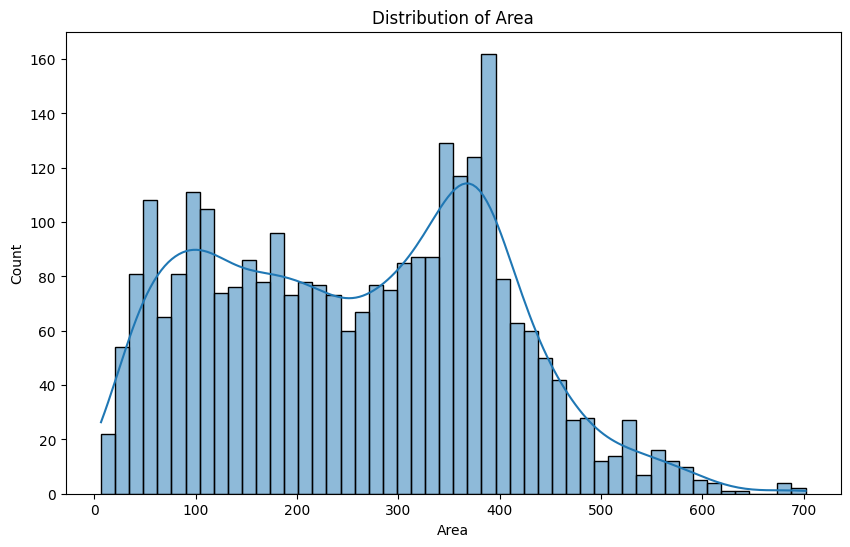

<Figure size 640x480 with 0 Axes>

In [12]:
# Create a histogram of AREA distribution
plt.figure(figsize=(10, 6))
sns.histplot(data=field_data, x='Area', bins=50, kde=True)
plt.title('Distribution of Area')
plt.xlabel('Area')
plt.ylabel('Count')
plt.show()
plt.savefig('Area_Distribution.png')


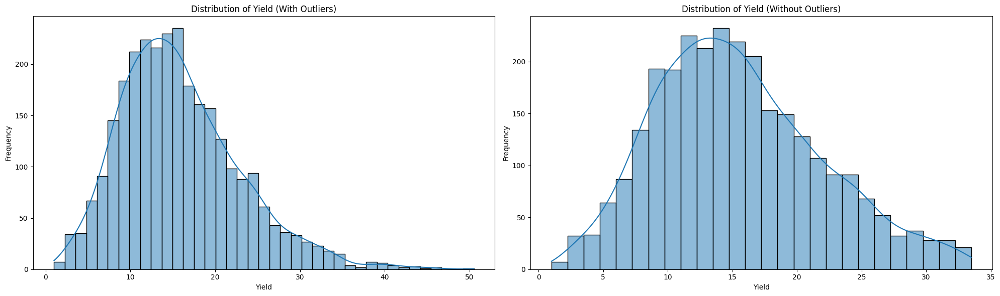

<Figure size 640x480 with 0 Axes>

In [13]:
# Create a grid plot of histogram distribution of Yield for both dataframes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Plot histogram for field_data
sns.histplot(data=field_data, x='Yield', kde=True, ax=ax1)
ax1.set_title('Distribution of Yield (With Outliers)')
ax1.set_xlabel('Yield')
ax1.set_ylabel('Frequency')

# Plot histogram for no_outlier_df
sns.histplot(data=no_outlier_df, x='Yield', kde=True, ax=ax2)
ax2.set_title('Distribution of Yield (Without Outliers)')
ax2.set_xlabel('Yield')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()
plt.savefig('Yield_Distribution.png')

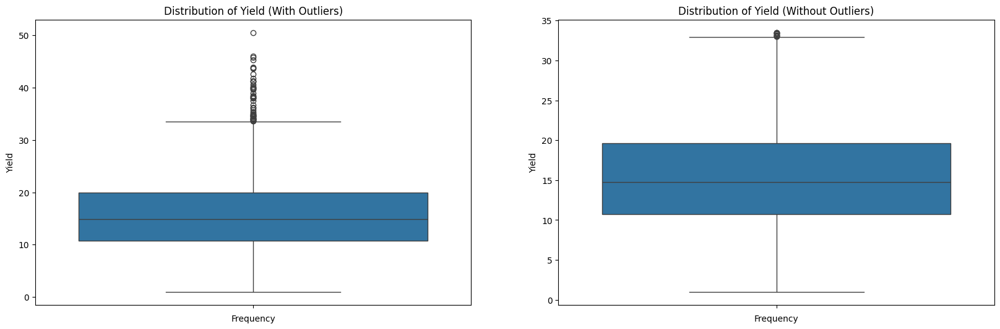

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [14]:
# Create a grid plot of histogram distribution of Yield for both dataframes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

plt.figure(figsize=(10, 6))
sns.boxplot(data=field_data, y='Yield', ax=ax1)
ax1.set_title('Distribution of Yield (With Outliers)')
ax1.set_xlabel('Frequency')
ax1.set_ylabel('Yield')

# Plot histogram for no_outlier_df
plt.figure(figsize=(10, 6))
sns.boxplot(data=no_outlier_df, y='Yield', ax=ax2)
ax2.set_title('Distribution of Yield (Without Outliers)')
ax2.set_xlabel('Frequency')
ax2.set_ylabel('Yield')

plt.tight_layout()
plt.show()
plt.savefig('Yield_Distribution_Boxplot.png')


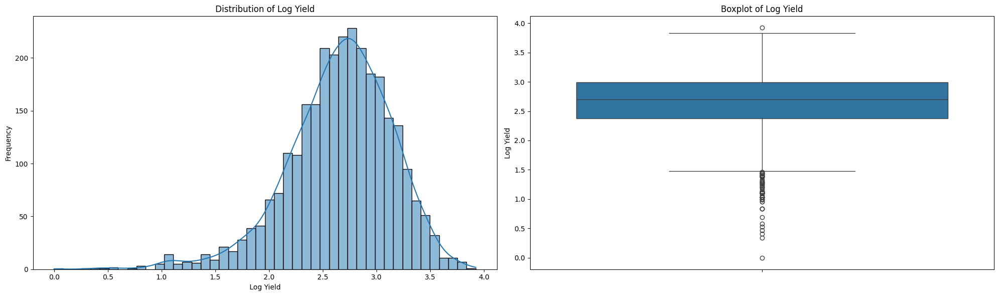

<Figure size 640x480 with 0 Axes>

In [15]:
field_data['Log_Yield'] = np.log(field_data['Yield'])
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Histogram for Log Yield
sns.histplot(data=field_data, x='Log_Yield', kde=True, ax=ax1)
ax1.set_title('Distribution of Log Yield')
ax1.set_xlabel('Log Yield')
ax1.set_ylabel('Frequency')

# Boxplot for Log Yield
sns.boxplot(data=field_data, y='Log_Yield', ax=ax2)
ax2.set_title('Boxplot of Log Yield')
ax2.set_ylabel('Log Yield')

plt.tight_layout()
plt.show()
plt.savefig('Log_Yield_Distribution_and_Boxplot.png')



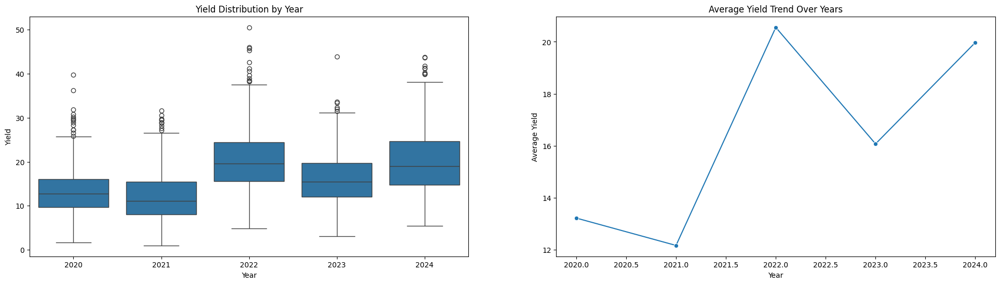

<Figure size 640x480 with 0 Axes>

In [16]:
# Create a grid plot with boxplot and line plot side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 6))

# Create a boxplot of Yield distribution by Year
sns.boxplot(data=field_data, x='Year', y='Yield', ax=ax1)
ax1.set_title('Yield Distribution by Year')
ax1.set_xlabel('Year')
ax1.set_ylabel('Yield')

# Create a line plot to show the trend of average Yield over the years
yearly_avg_yield = field_data.groupby('Year')['Yield'].mean().reset_index()
sns.lineplot(data=yearly_avg_yield, x='Year', y='Yield', marker='o', ax=ax2)
ax2.set_title('Average Yield Trend Over Years')
ax2.set_xlabel('Year')
ax2.set_ylabel('Average Yield')
plt.show()
plt.savefig('Yield_Trend_Over_Years.png')


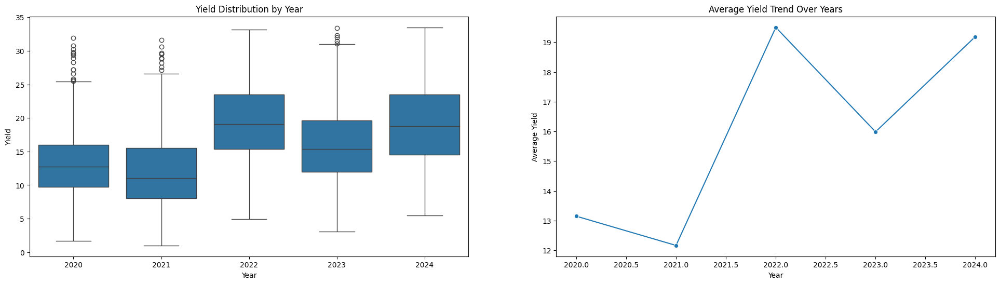

In [17]:
# Create a grid plot with boxplot and line plot side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 6))

# Create a boxplot of Yield distribution by Year
sns.boxplot(data=no_outlier_df, x='Year', y='Yield', ax=ax1)
ax1.set_title('Yield Distribution by Year')
ax1.set_xlabel('Year')
ax1.set_ylabel('Yield')

# Create a line plot to show the trend of average Yield over the years
yearly_avg_yield = no_outlier_df.groupby('Year')['Yield'].mean().reset_index()
sns.lineplot(data=yearly_avg_yield, x='Year', y='Yield', marker='o', ax=ax2)
ax2.set_title('Average Yield Trend Over Years')
ax2.set_xlabel('Year')
ax2.set_ylabel('Average Yield')
plt.show()
#plt.savefig('Yield_Trend_Over_Years.png')

In [18]:
print(max_ndvi_data['MAX_NDVI'].describe())




count    2897.000000
mean        0.656426
std         0.119860
min         0.208973
25%         0.572262
50%         0.665990
75%         0.748097
max         0.923945
Name: MAX_NDVI, dtype: float64


In [20]:
max_ndvi_data.columns

Index(['Field_ID', 'Year', 'MAX_NDVI', 'date', 'DOY'], dtype='object')

C:\Users\Dgebe N\AppData\Local\Temp\ipykernel_16376\812536770.py:17: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


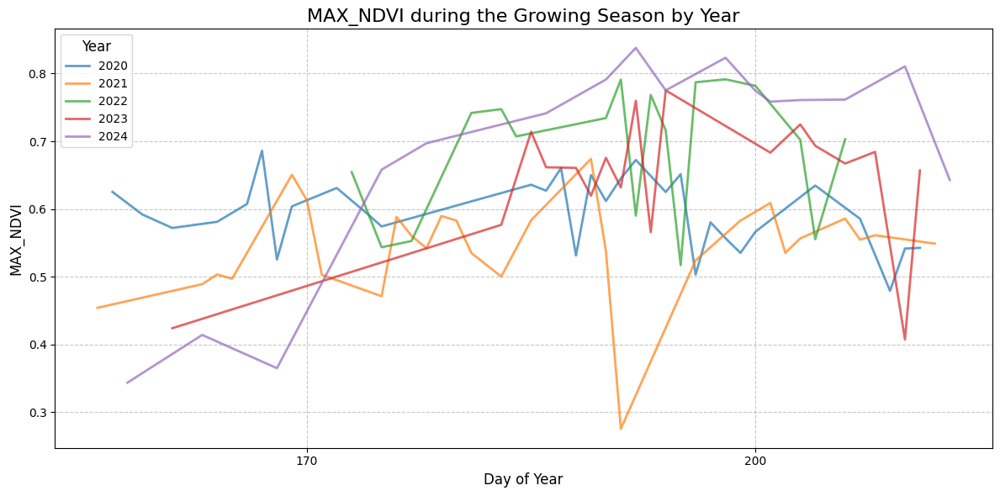

<Figure size 640x480 with 0 Axes>

In [21]:
# Convert 'date' column to datetime
max_ndvi_data['date'] = pd.to_datetime(max_ndvi_data['date'])

# Add DOY (Day of Year) column
max_ndvi_data['DOY'] = max_ndvi_data['date'].dt.dayofyear
# Define a custom color palette for each year
color_palette = {
    2020: '#1f77b4',  # Blue
    2021: '#ff7f0e',  # Orange
    2022: '#2ca02c',  # Green
    2023: '#d62728',   # Re
    2024: '#9467bd'   # Purple
}

# Create a line plot of MAX_NDVI with hue Year, using the custom color palette
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=max_ndvi_data,
    x='DOY',
    y='MAX_NDVI',
    hue='Year',
    palette=color_palette,
    ci=None,  # Remove confidence interval
    linewidth=2,
    alpha=0.7
)

# Customize the plot
plt.title('MAX_NDVI during the Growing Season by Year', fontsize=16)
plt.xlabel('Day of Year', fontsize=12)
plt.ylabel('MAX_NDVI', fontsize=12)
plt.legend(title='Year', title_fontsize='12', fontsize='10')

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust x-axis to show only every 30th day
plt.xticks(range(170, 220, 30))
# Show the plot
plt.tight_layout()
plt.show()
plt.savefig('MAX_NDVI_by_Year.png')

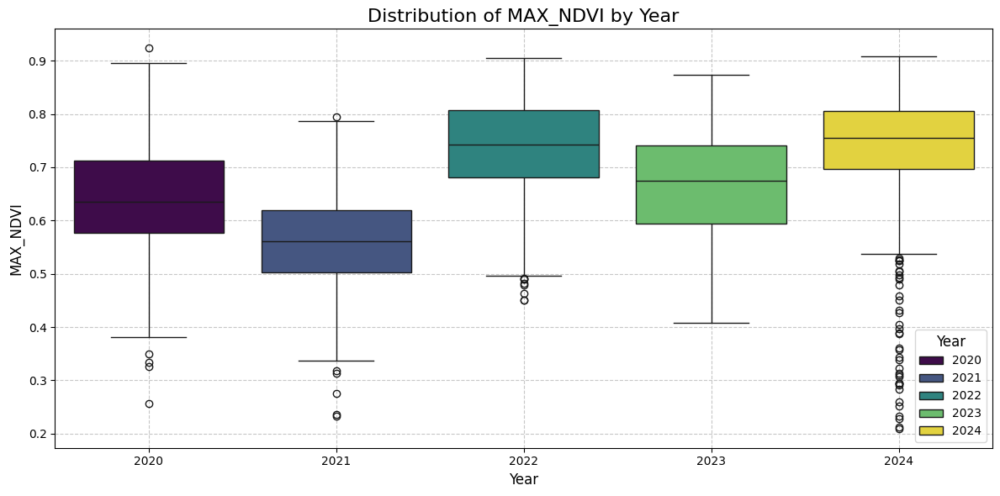

<Figure size 640x480 with 0 Axes>

In [22]:
# Create a boxplot of MAX_NDVI with hue Year
plt.figure(figsize=(12, 6))
sns.boxplot(data=max_ndvi_data, x='Year', y='MAX_NDVI', hue='Year', palette='viridis')
plt.title('Distribution of MAX_NDVI by Year', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('MAX_NDVI', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=0)
plt.legend(title='Year', title_fontsize='12', fontsize='10')
plt.tight_layout()
plt.show()


plt.savefig('MAX_NDVI_Boxplot_by_Year.png')


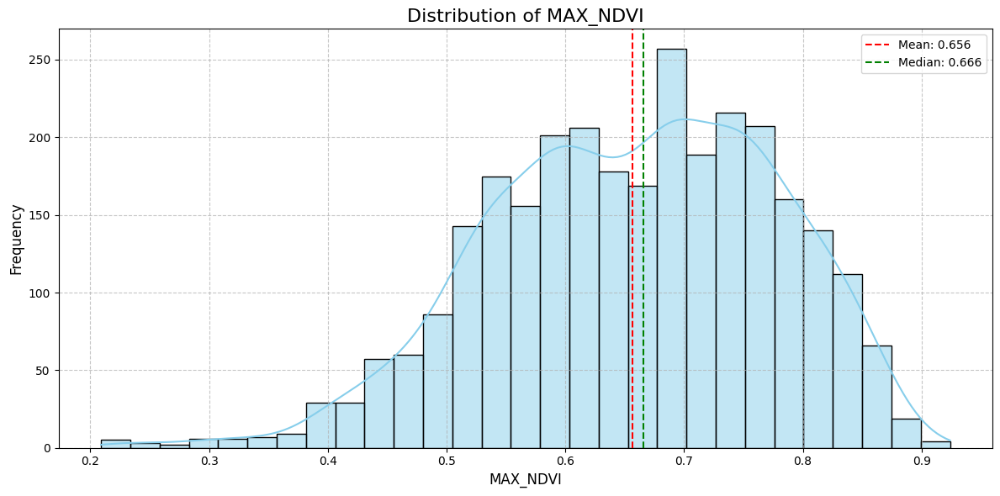

<Figure size 640x480 with 0 Axes>

In [23]:
# Visualize distribution of MAX_NDVI

plt.figure(figsize=(12, 6))

# Create a histogram with kernel density estimation
sns.histplot(data=max_ndvi_data, x='MAX_NDVI', kde=True, color='skyblue')

# Customize the plot
plt.title('Distribution of MAX_NDVI', fontsize=16)
plt.xlabel('MAX_NDVI', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Show mean and median lines
mean_ndvi = max_ndvi_data['MAX_NDVI'].mean()
median_ndvi = max_ndvi_data['MAX_NDVI'].median()

plt.axvline(mean_ndvi, color='red', linestyle='--', label=f'Mean: {mean_ndvi:.3f}')
plt.axvline(median_ndvi, color='green', linestyle='--', label=f'Median: {median_ndvi:.3f}')

plt.legend(fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()
plt.savefig('MAX_NDVI_Distribution.png')


In [24]:
print(monthly_ndvi_data[['6_NDVI', '7_NDVI']].describe())


            6_NDVI       7_NDVI
count  2897.000000  2895.000000
mean      0.334405     0.595824
std       0.118542     0.132278
min       0.120110     0.193200
25%       0.236308     0.498152
50%       0.318359     0.595658
75%       0.412091     0.697322
max       0.732477     0.900563


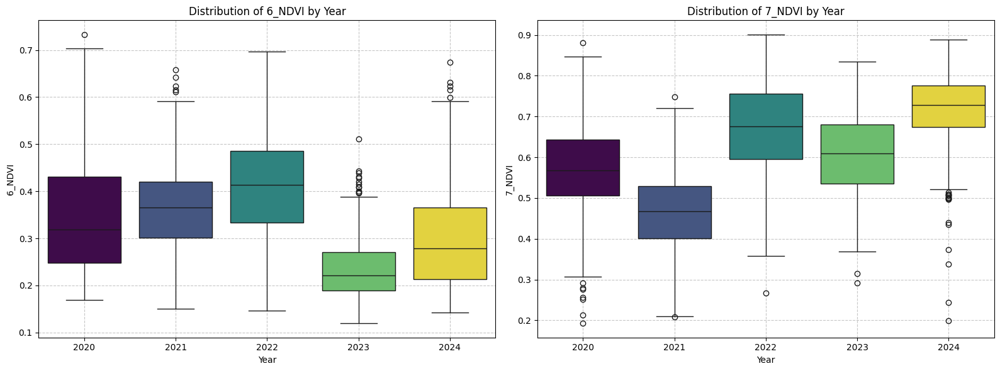

<Figure size 640x480 with 0 Axes>

In [25]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot for 6_NDVI
sns.boxplot(x='Year', y='6_NDVI', data=monthly_ndvi_data, ax=ax1, hue='Year', palette='viridis')
ax1.set_title('Distribution of 6_NDVI by Year')
ax1.set_xlabel('Year')
ax1.set_ylabel('6_NDVI')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.legend_.remove()  # Remove legend as it's redundant with x-axis

# Plot for 7_NDVI
sns.boxplot(x='Year', y='7_NDVI', data=monthly_ndvi_data, ax=ax2, hue='Year', palette='viridis')
ax2.set_title('Distribution of 7_NDVI by Year')
ax2.set_xlabel('Year')
ax2.set_ylabel('7_NDVI')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.legend_.remove()  # Remove legend as it's redundant with x-axis

plt.tight_layout()
plt.show()
plt.savefig('Monthly_NDVI_by_Year.png')


Distribution of NDVI Data

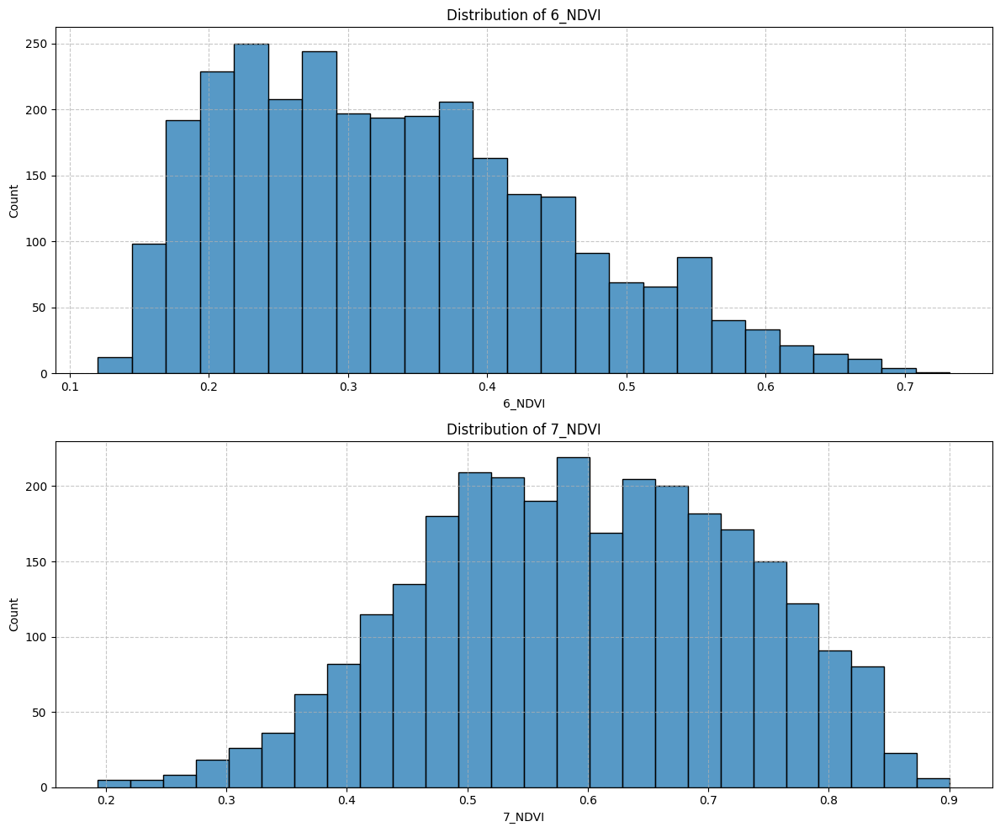

<Figure size 640x480 with 0 Axes>

In [26]:
# Create a grid plot of histogram distributions for 6_NDVI and 7_NDVI
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

# Histogram for 6_NDVI
sns.histplot(data=monthly_ndvi_data, x='6_NDVI', ax=ax1)
ax1.set_title('Distribution of 6_NDVI')
ax1.set_xlabel('6_NDVI')
ax1.set_ylabel('Count')
ax1.grid(True, linestyle='--', alpha=0.7)

# Histogram for 7_NDVI
sns.histplot(data=monthly_ndvi_data, x='7_NDVI', ax=ax2)
ax2.set_title('Distribution of 7_NDVI')
ax2.set_xlabel('7_NDVI')
ax2.set_ylabel('Count')
ax2.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()
plt.savefig('Monthly_NDVI_Distribution.png')


In [31]:
ts_climate_data.columns

Index(['Field_ID', 'date', 'surface_solar_radiation_downwards_sum',
       'temperature_2m', 'temperature_2m_max', 'temperature_2m_min',
       'total_precipitation_sum', 'v_component_of_wind_10m', 'Year', 'Month',
       'DOY', 'relative_humidity', 'vapor_pressure_deficit'],
      dtype='object')

In [29]:
# ts_climate_data = ts_climate_data[['date', 'Field_ID', 'Year', 'Month', 'DOY'] + [col for col in ts_climate_data.columns if col not in ['date', 'Field_ID', 'Year', 'Month', 'DOY']]]

In [32]:
print('Climate Data Statistics Sumamry')
ts_climate_data.drop(columns=['Year', 'Month']).describe()


Climate Data Statistics Sumamry


,surface_solar_radiation_downwards_sum,temperature_2m,temperature_2m_max,temperature_2m_min,total_precipitation_sum,v_component_of_wind_10m,DOY,relative_humidity,vapor_pressure_deficit
count,1.158800e+04,11588.000000,11588.000000,11588.000000,11588.000000,11588.000000,11588.000000,11588.000000,11588.000000
mean,6.338145e+08,291.945078,305.318038,279.660306,0.050281,-0.518741,167.417328,54.204066,1.008507
std,6.683940e+07,3.052915,3.533427,4.049665,0.030307,0.799738,34.217601,8.299216,0.251282
min,4.737325e+08,282.435001,293.430356,270.487991,0.005024,-2.452046,121.000000,35.390910,0.480194
25%,5.953030e+08,290.278029,303.825949,278.117865,0.022348,-1.130994,144.500000,48.371387,0.840363
50%,6.455339e+08,292.487823,305.481262,280.526199,0.047300,-0.644644,167.500000,54.754768,1.010811
75%,6.800400e+08,293.841821,307.469581,282.388321,0.071023,0.141122,190.500000,59.136613,1.198178
max,7.711937e+08,296.836034,312.077087,287.893583,0.144114,1.544736,214.000000,74.655321,1.718289


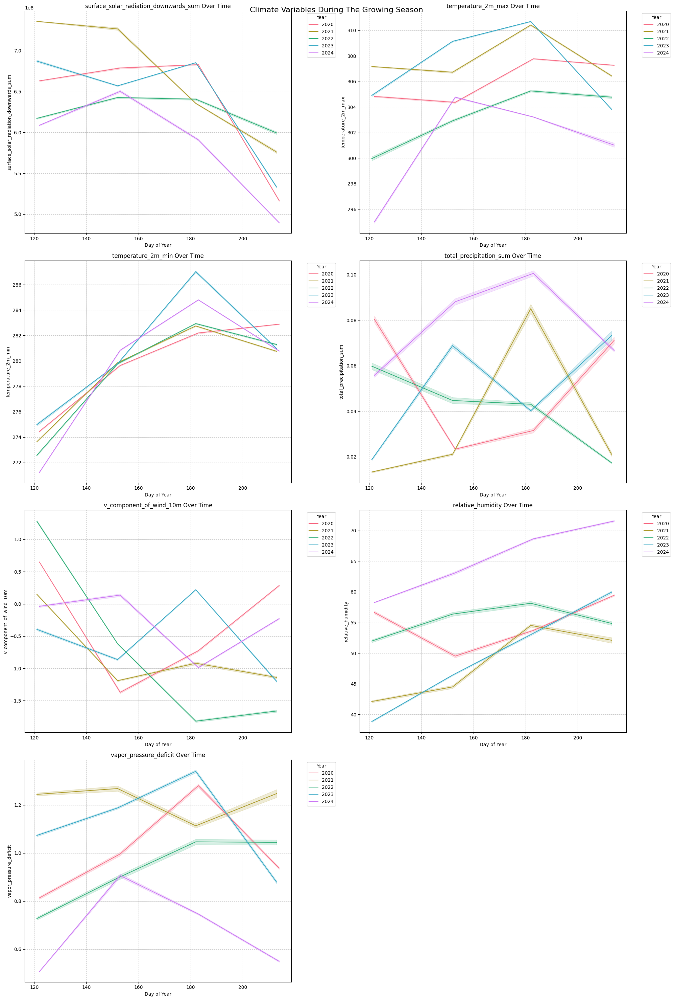

<Figure size 640x480 with 0 Axes>

In [33]:
# Create a line plot for 5 selected climate variables with hue by year
# Define a custom color palette for better distinction between years
custom_palette = sns.color_palette("husl", n_colors=len(ts_climate_data['Year'].unique()))

# Create a 4x2 subplot grid
fig, axes = plt.subplots(4, 2, figsize=(20, 30))
fig.suptitle('Climate Variables During The Growing Season', fontsize=16)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# List of variables to plot
variables = [
    'surface_solar_radiation_downwards_sum',
    'temperature_2m_max',
    'temperature_2m_min',
    'total_precipitation_sum',
    'v_component_of_wind_10m',
    'relative_humidity', 
    'vapor_pressure_deficit'
]

# Create line plots for each variable
for i, var in enumerate(variables):
    sns.lineplot(data=ts_climate_data, x='DOY', y=var, hue='Year', ax=axes[i], palette=custom_palette)
    axes[i].set_title(f'{var} Over Time')
    axes[i].set_xlabel('Day of Year')
    axes[i].set_ylabel(var)
    axes[i].legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[i].grid(True, linestyle='--', alpha=0.7)

# Remove the last subplot if there are only 7 variables
if len(variables) < 8:
    fig.delaxes(axes[-1])

plt.tight_layout()
plt.show()
plt.savefig('Climate_Variables_During_The_Growing_Season.png')


In [34]:
soil_info_data.describe()


,bdod,cec,clay,phh2o,sand,silt,soc
count,1504.000000,1504.000000,1504.000000,1504.000000,1504.000000,1504.000000,1504.000000
mean,99.912106,413.722062,292.081304,67.834146,357.434223,350.483904,735.624362
std,2.802737,38.613610,23.613023,1.395223,36.378895,26.537382,134.100581
min,91.441315,243.281300,217.846188,63.463475,257.207304,272.055115,482.275849
25%,98.037383,392.085669,277.702933,66.795962,334.321675,333.126739,646.670981
50%,99.758835,420.957193,291.843404,67.734012,359.593812,350.320167,696.562882
75%,101.768202,441.605548,307.349877,68.837712,381.183920,365.410662,804.438324
max,109.650667,503.781269,363.015922,71.924494,485.456633,456.329328,1271.938072


Distribution of Soil Features

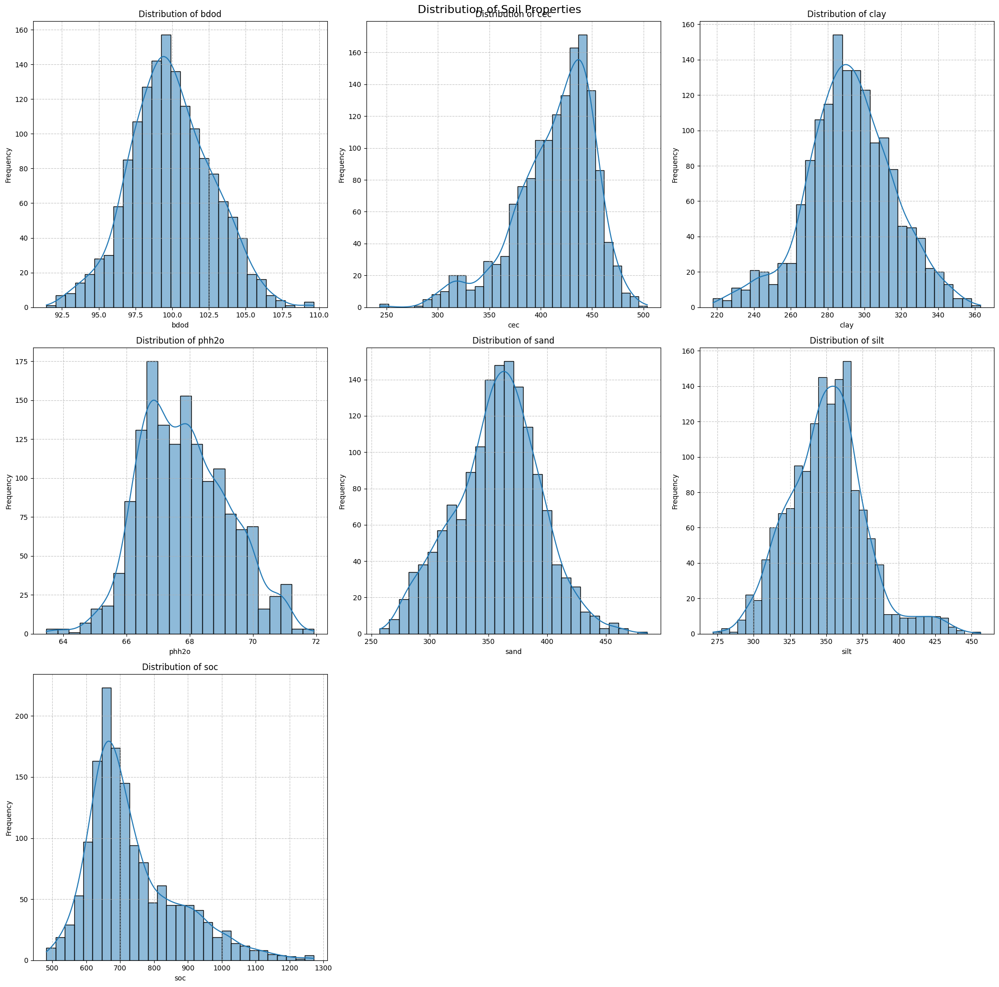

<Figure size 640x480 with 0 Axes>

In [35]:
soil_columns = ['bdod', 'cec', 'clay', 'phh2o', 'sand', 'silt', 'soc']

# Set up the grid plot
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
fig.suptitle('Distribution of Soil Properties', fontsize=16)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Create histograms for each soil property
for i, column in enumerate(soil_columns):
    sns.histplot(data=soil_info_data, x=column, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    axes[i].grid(True, linestyle='--', alpha=0.7)

# Remove the last two subplots as we only have 7 variables
for j in range(7, 9):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()
plt.savefig('Soil_Properties_Distribution.png')


In [36]:
ml_climate_data.columns


Index(['Field_ID', 'Year', '5_relative_humidity', '6_relative_humidity',
       '7_relative_humidity', '8_relative_humidity',
       '5_surface_solar_radiation_downwards_sum',
       '6_surface_solar_radiation_downwards_sum',
       '7_surface_solar_radiation_downwards_sum',
       '8_surface_solar_radiation_downwards_sum', '5_temperature_2m_max',
       '6_temperature_2m_max', '7_temperature_2m_max', '8_temperature_2m_max',
       '5_temperature_2m_min', '6_temperature_2m_min', '7_temperature_2m_min',
       '8_temperature_2m_min', '5_total_precipitation_sum',
       '6_total_precipitation_sum', '7_total_precipitation_sum',
       '8_total_precipitation_sum', '5_v_component_of_wind_10m',
       '6_v_component_of_wind_10m', '7_v_component_of_wind_10m',
       '8_v_component_of_wind_10m', '5_vapor_pressure_deficit',
       '6_vapor_pressure_deficit', '7_vapor_pressure_deficit',
       '8_vapor_pressure_deficit'],
      dtype='object')

Distribution Climate of Features

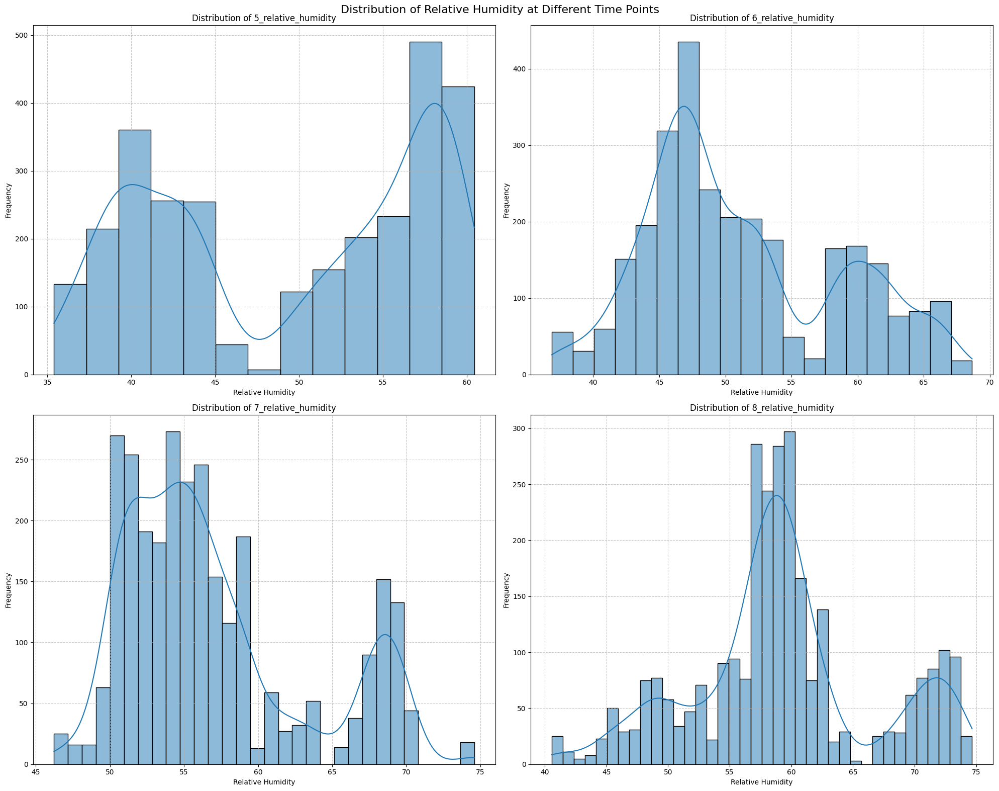

<Figure size 640x480 with 0 Axes>

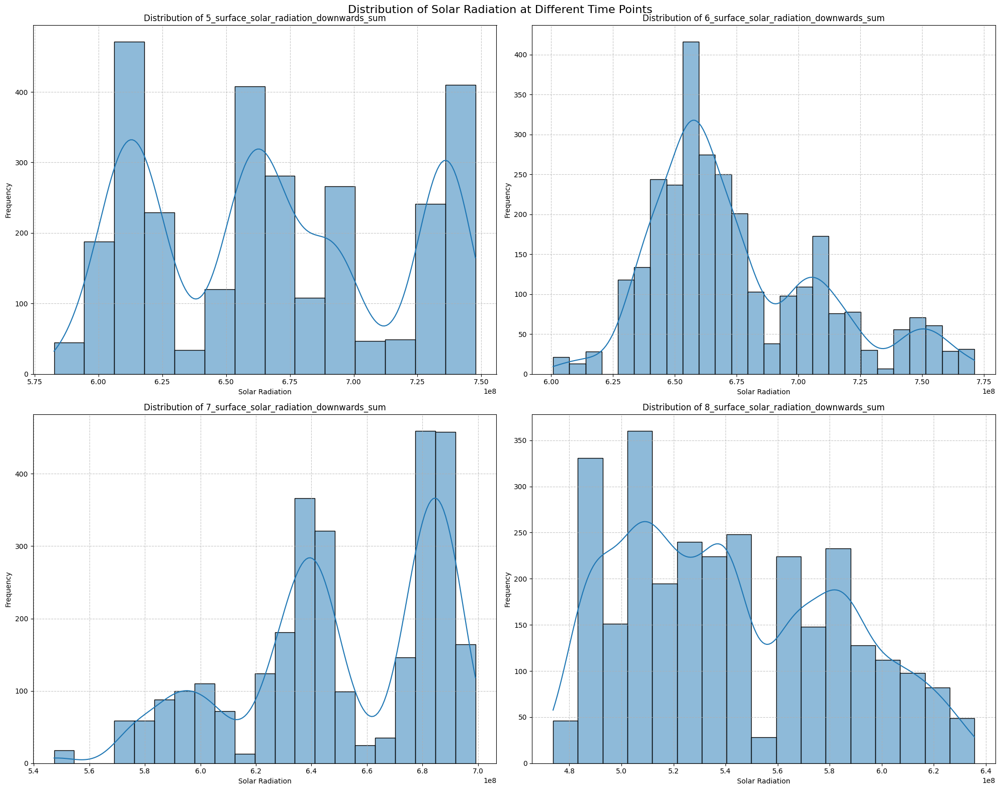

<Figure size 640x480 with 0 Axes>

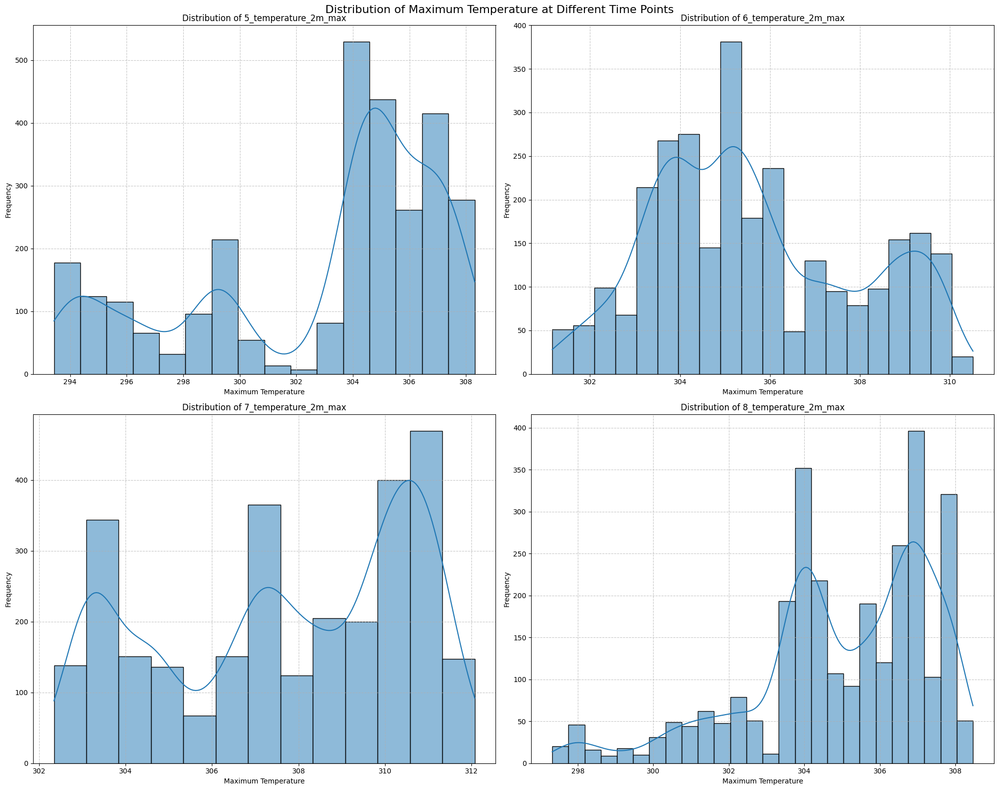

<Figure size 640x480 with 0 Axes>

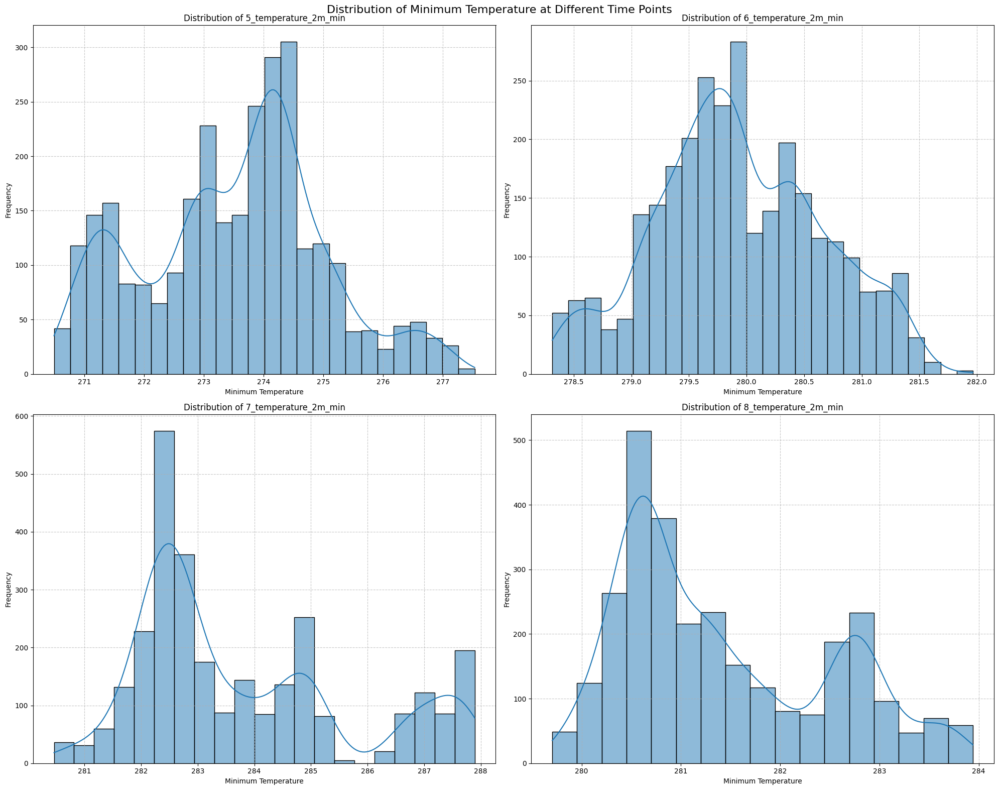

<Figure size 640x480 with 0 Axes>

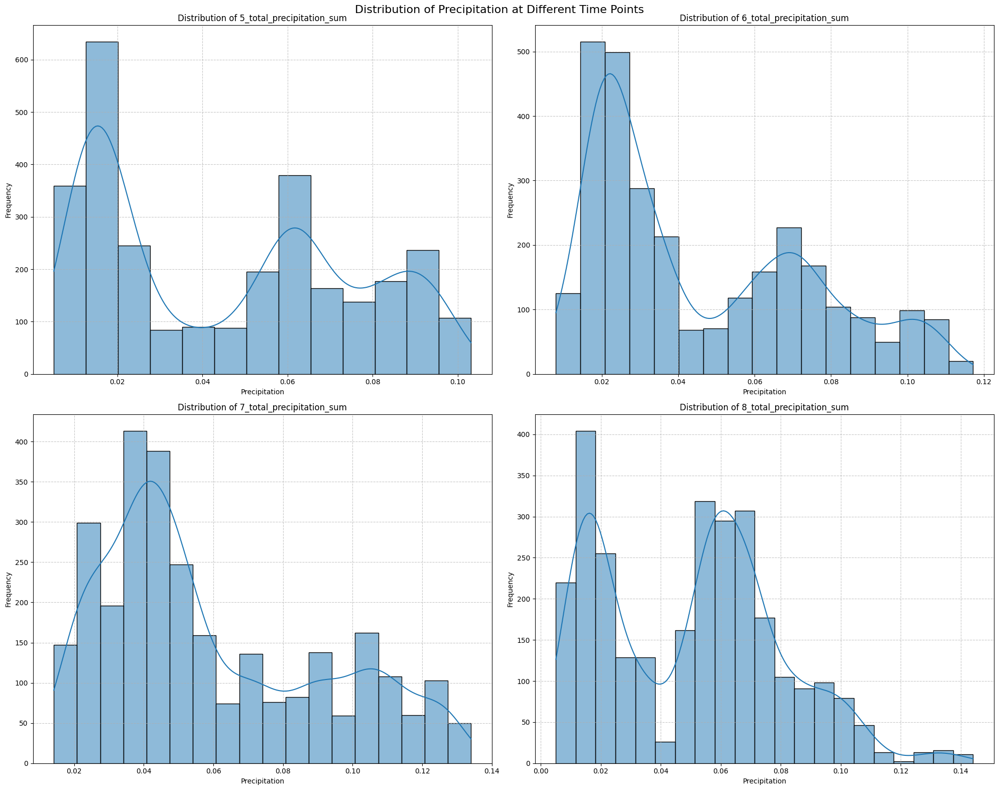

<Figure size 640x480 with 0 Axes>

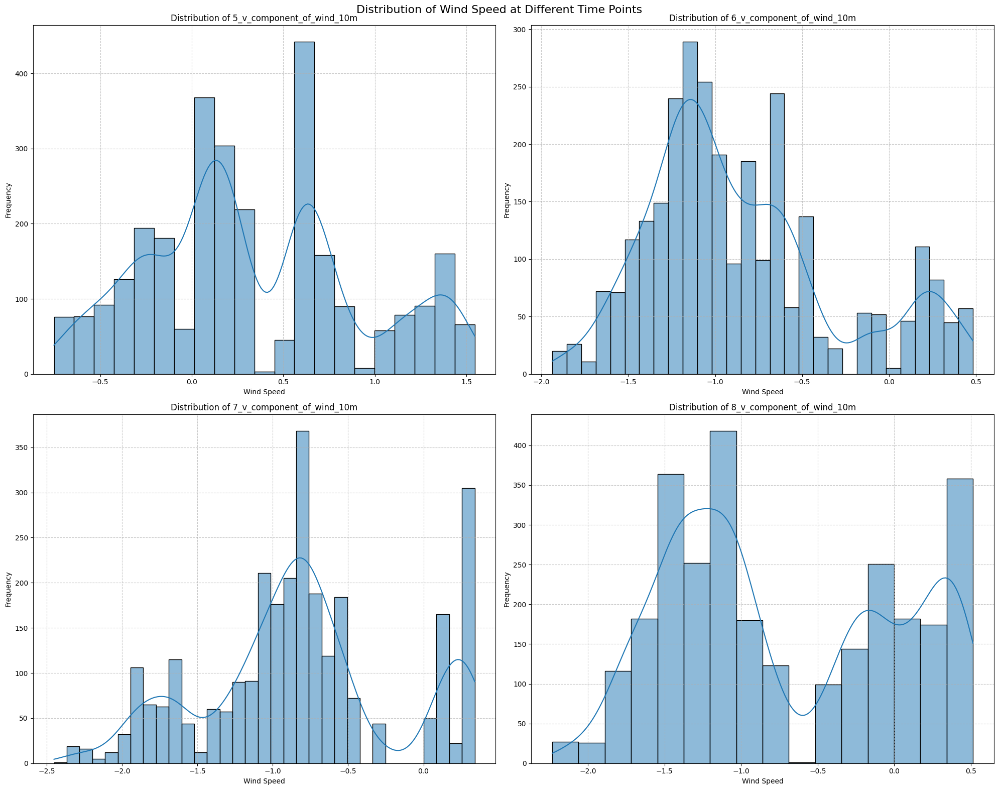

<Figure size 640x480 with 0 Axes>

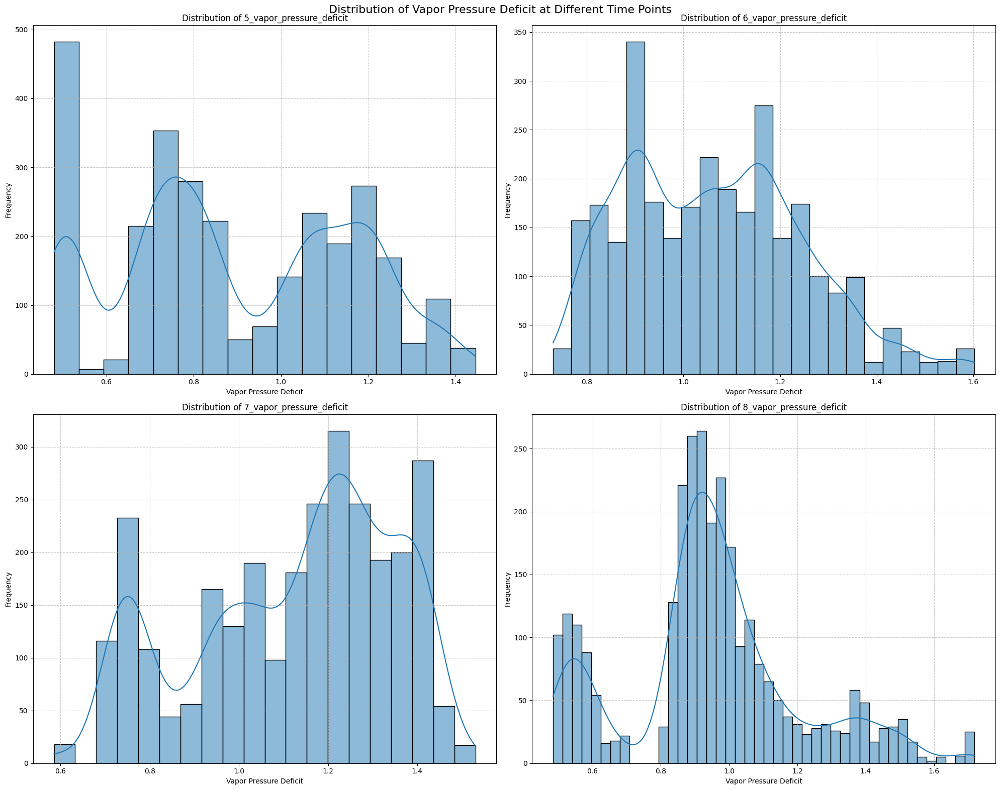

<Figure size 640x480 with 0 Axes>

In [38]:
humidity_columns = ['5_relative_humidity', '6_relative_humidity', '7_relative_humidity', '8_relative_humidity']

solar_radition = ['5_surface_solar_radiation_downwards_sum',
                  '6_surface_solar_radiation_downwards_sum',
                  '7_surface_solar_radiation_downwards_sum',
                  '8_surface_solar_radiation_downwards_sum']

temp_max = ['5_temperature_2m_max', '6_temperature_2m_max', '7_temperature_2m_max', '8_temperature_2m_max']

temp_min = ['5_temperature_2m_min', '6_temperature_2m_min', '7_temperature_2m_min', '8_temperature_2m_min']

precipitation = ['5_total_precipitation_sum', '6_total_precipitation_sum', '7_total_precipitation_sum', '8_total_precipitation_sum']

wind_speed = ['5_v_component_of_wind_10m', '6_v_component_of_wind_10m', '7_v_component_of_wind_10m', '8_v_component_of_wind_10m']

vapor_pressure_deficit = ['5_vapor_pressure_deficit', '6_vapor_pressure_deficit', '7_vapor_pressure_deficit', '8_vapor_pressure_deficit']


column_groups = [
    humidity_columns,
    solar_radition,
    temp_max,
    temp_min,
    precipitation,
    wind_speed,
    vapor_pressure_deficit
]

# Names for each group
group_names = [
    'Relative Humidity',
    'Solar Radiation',
    'Maximum Temperature',
    'Minimum Temperature',
    'Precipitation',
    'Wind Speed',
    'Vapor Pressure Deficit'
]

# Iterate through each group of columns
for columns, group_name in zip(column_groups, group_names):
    # Set up the plot
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle(f'Distribution of {group_name} at Different Time Points', fontsize=16)
    
    # Flatten the axes array for easier iteration
    axes = axes.flatten()
    
    # Create histograms for each column in the group
    for i, column in enumerate(columns):
        sns.histplot(data=ml_climate_data, x=column, kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {column}')
        axes[i].set_xlabel(group_name)
        axes[i].set_ylabel('Frequency')
        axes[i].grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    plt.savefig(f'{group_name}_Distribution_at_Different_Time_Points.png')


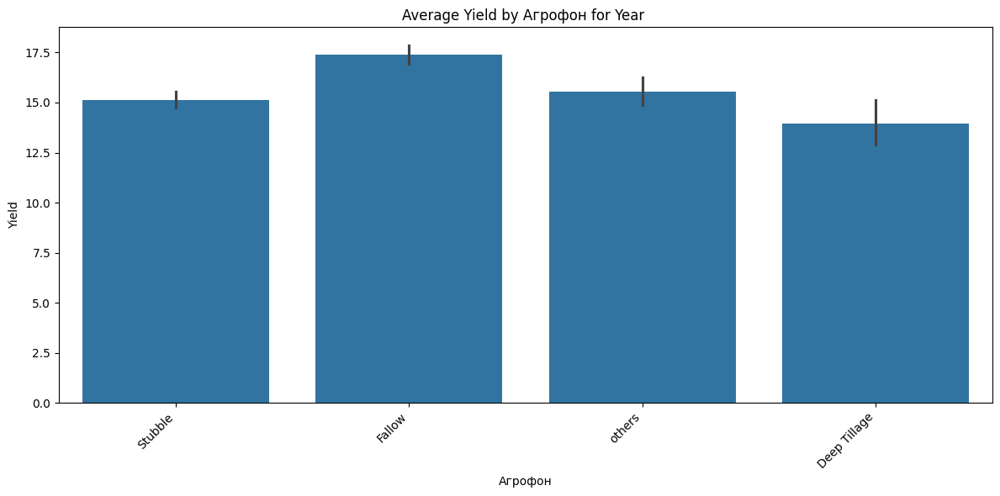

<Figure size 640x480 with 0 Axes>

In [63]:
ml_data = map_agrofon_to_group(ml_data)
# Create a barplot of Агрофон vs Yield
years = [2020, 2021, 2022, 2023, 2024]
# Function to create barplot of Агрофон vs Yield for a specific year
def plot_yield_by_agrofon(data):
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Агрофон', y='Yield', data=data)
    plt.title(f'Average Yield by Агрофон for Year ')
    plt.xlabel('Агрофон')
    plt.ylabel('Yield')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    plt.savefig(f'Average_Yield_by_Агрофон_.png')

# Loop through years and create plots

plot_yield_by_agrofon(ml_data)



We see that Fallow seems to have significant effect on increased Wheat Yields over a 5 year period

Scatterplots for Features vs Yields

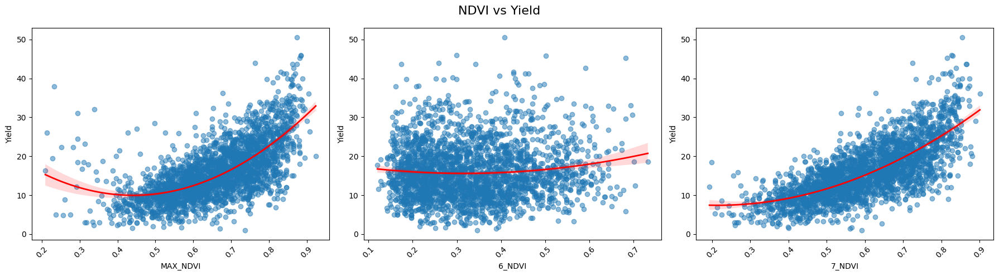

<Figure size 640x480 with 0 Axes>

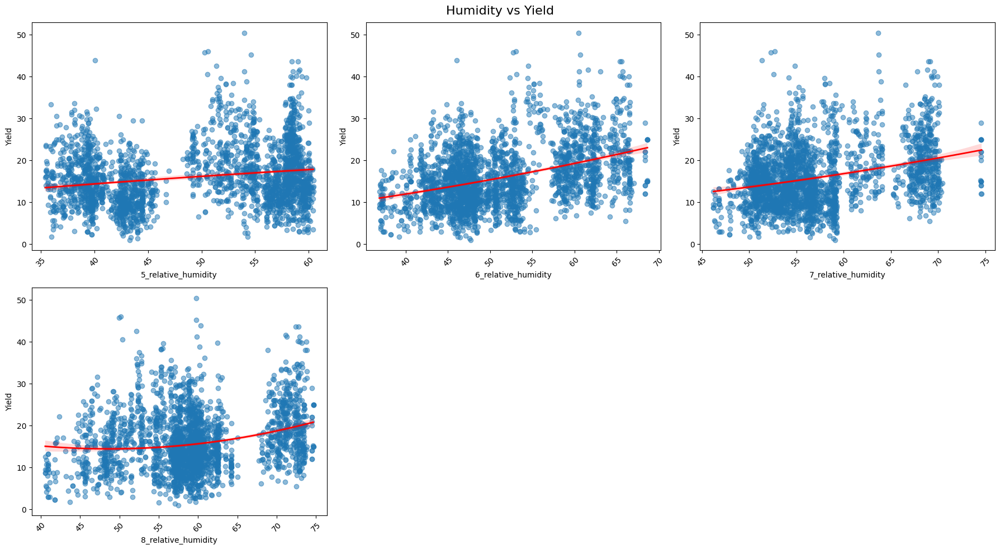

<Figure size 640x480 with 0 Axes>

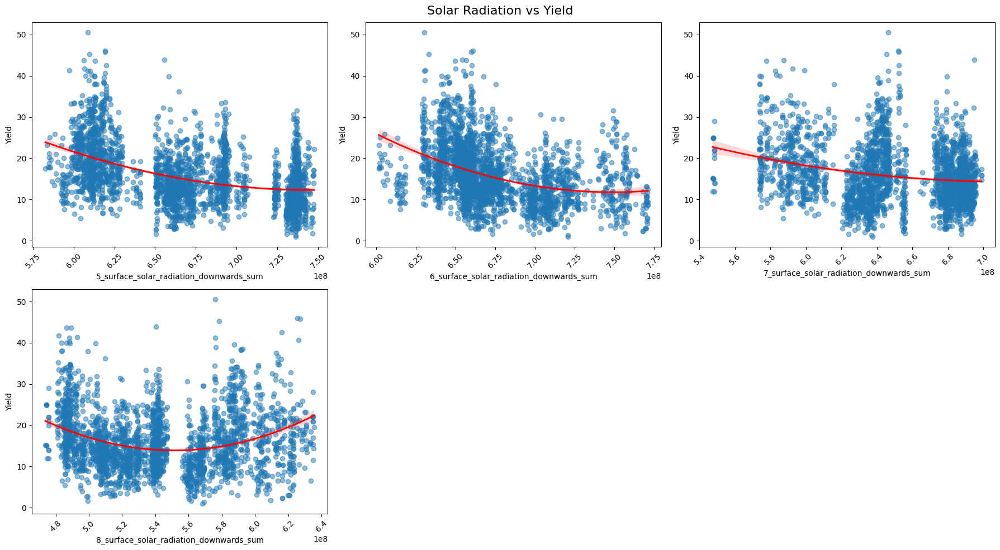

<Figure size 640x480 with 0 Axes>

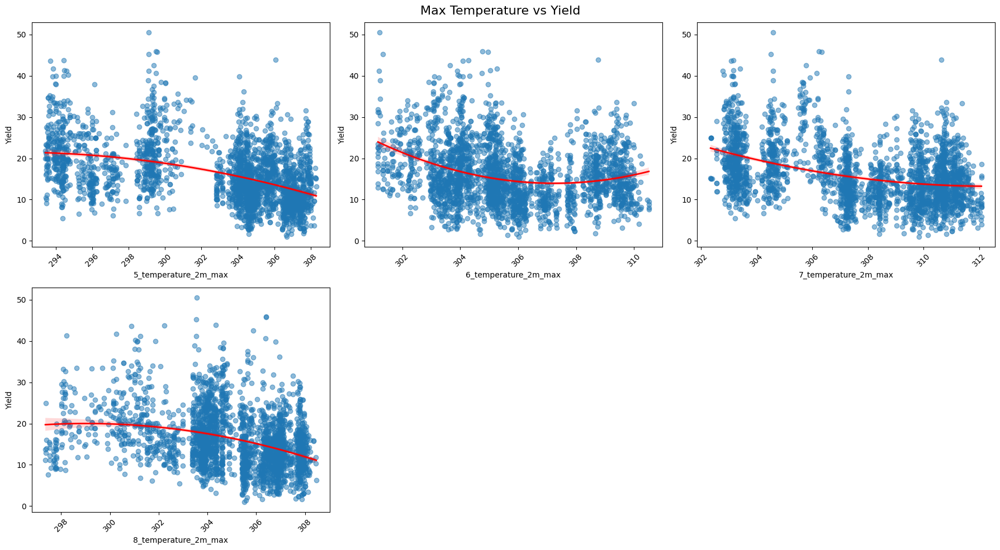

<Figure size 640x480 with 0 Axes>

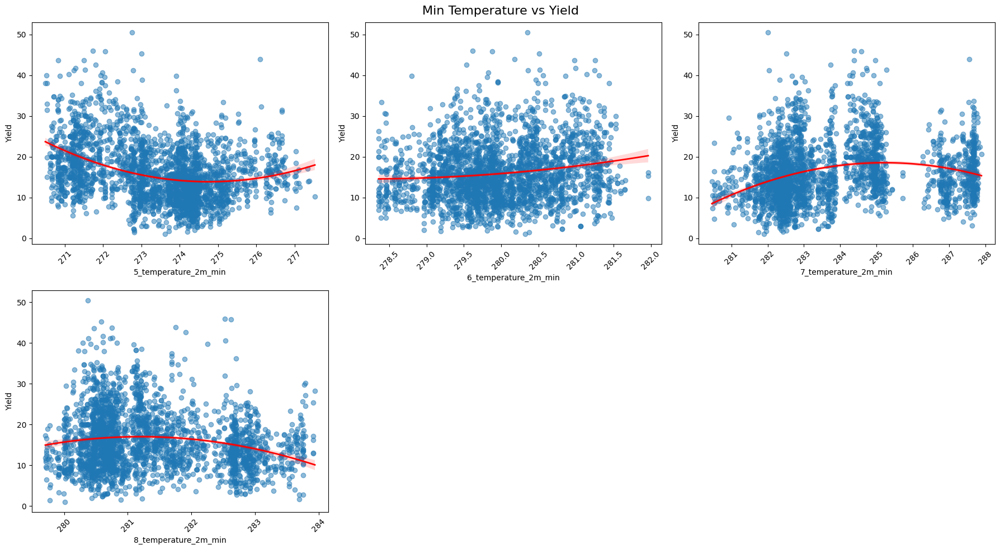

<Figure size 640x480 with 0 Axes>

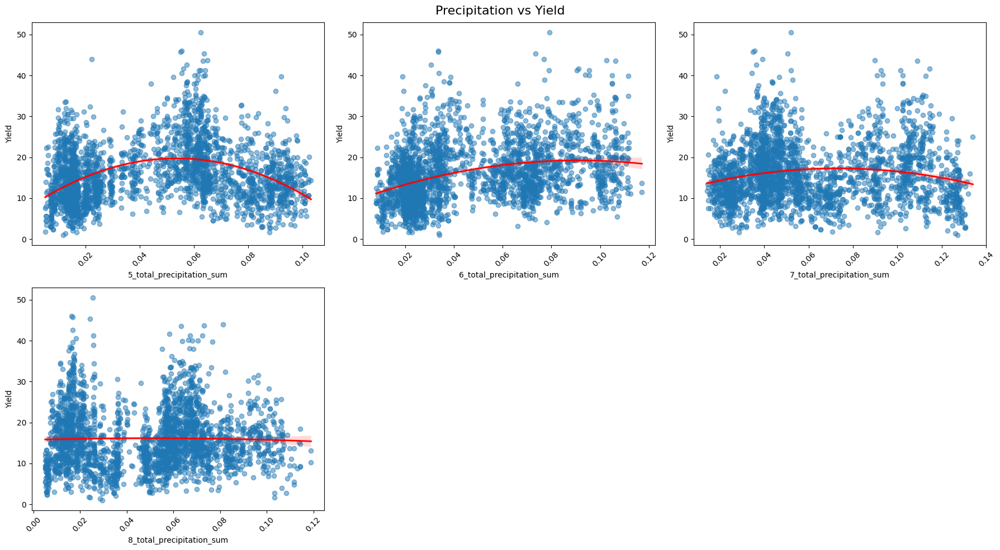

<Figure size 640x480 with 0 Axes>

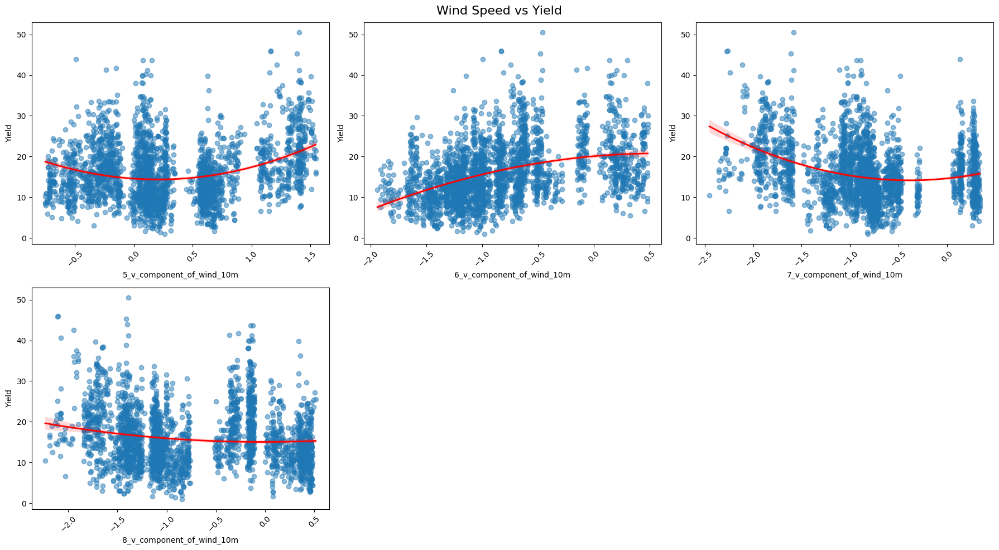

<Figure size 640x480 with 0 Axes>

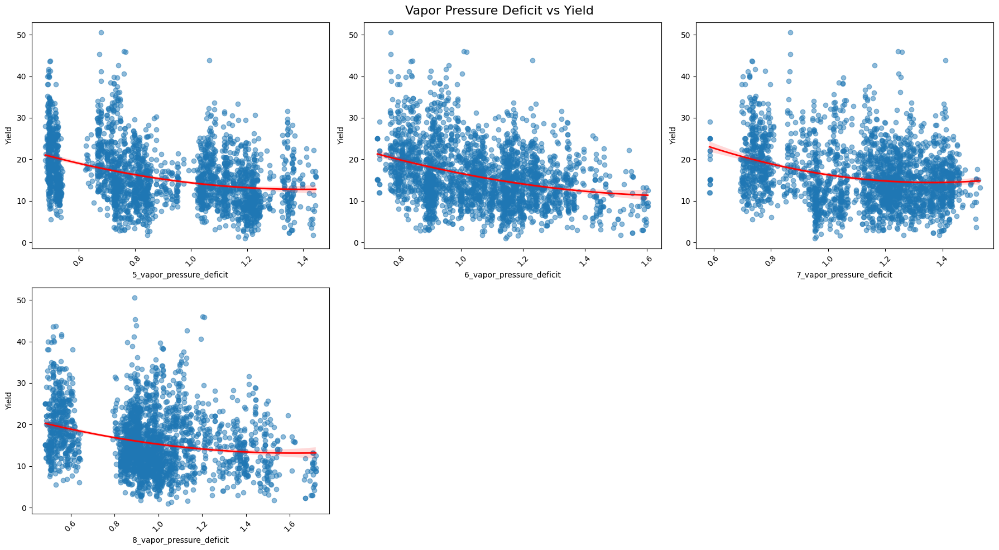

<Figure size 640x480 with 0 Axes>

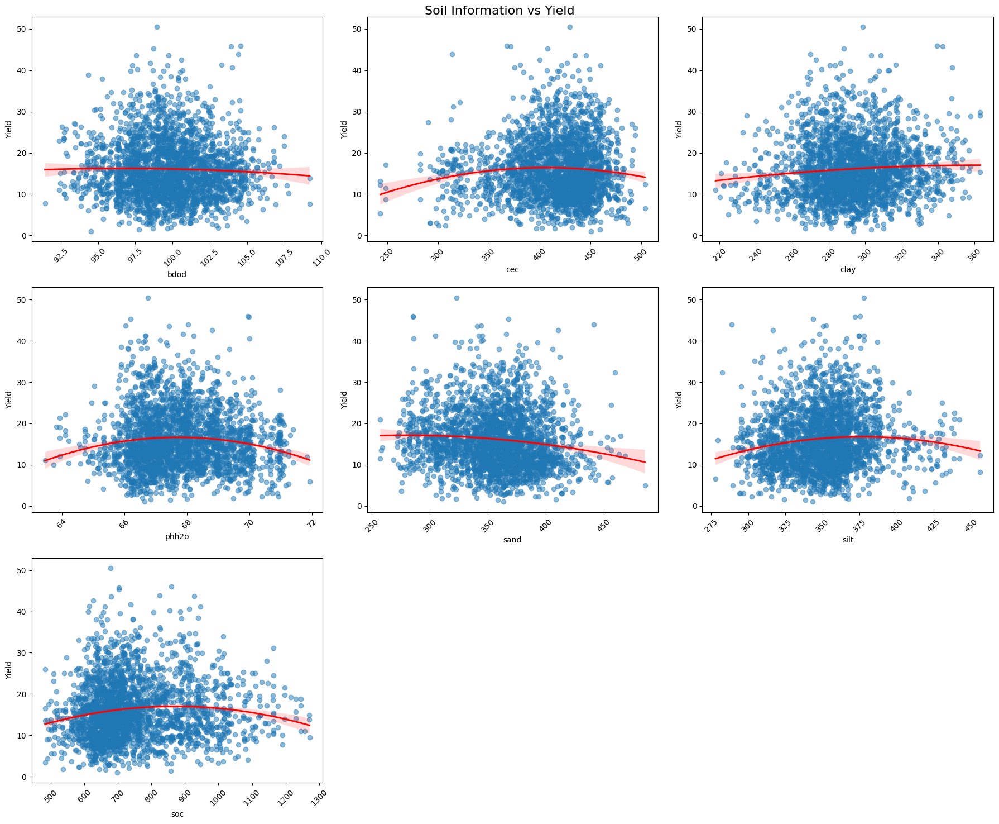

<Figure size 640x480 with 0 Axes>

In [48]:
ndvi = ['MAX_NDVI', '6_NDVI', '7_NDVI']
humidity_columns = ['5_relative_humidity', '6_relative_humidity', '7_relative_humidity', '8_relative_humidity']

solar_radition = ['5_surface_solar_radiation_downwards_sum',
                  '6_surface_solar_radiation_downwards_sum',
                  '7_surface_solar_radiation_downwards_sum',
                  '8_surface_solar_radiation_downwards_sum']

temp_max = ['5_temperature_2m_max', '6_temperature_2m_max', '7_temperature_2m_max', '8_temperature_2m_max']

temp_min = ['5_temperature_2m_min', '6_temperature_2m_min', '7_temperature_2m_min', '8_temperature_2m_min']

precipitation = ['5_total_precipitation_sum', '6_total_precipitation_sum', '7_total_precipitation_sum', '8_total_precipitation_sum']

wind_speed = ['5_v_component_of_wind_10m', '6_v_component_of_wind_10m', '7_v_component_of_wind_10m', '8_v_component_of_wind_10m']

vapor_pressure_deficit = ['5_vapor_pressure_deficit', '6_vapor_pressure_deficit', '7_vapor_pressure_deficit', '8_vapor_pressure_deficit']


soil_info = ['bdod', 'cec', 'clay', 'phh2o', 'sand', 'silt', 'soc']
# Function to create a grid of scatter plots with regression lines
def plot_scatter_grid(data, feature_groups, target='Yield', n_cols=3):
    for group_name, features in feature_groups.items():
        n_rows = (len(features) - 1) // n_cols + 1
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
        fig.suptitle(f'{group_name} vs {target}', fontsize=16)
        
        for i, feature in enumerate(features):
            row = i // n_cols
            col = i % n_cols
            ax = axes[row, col] if n_rows > 1 else axes[col]
            
            sns.regplot(x=feature, y=target, data=data, ax=ax, scatter_kws={'alpha':0.5},line_kws={'color': 'red', 'linewidth': 2}, order=2 )
            ax.set_xlabel(feature)
            ax.set_ylabel(target)
            ax.tick_params(axis='x', rotation=45)
        
        # Remove any unused subplots
        for j in range(i+1, n_rows*n_cols):
            row = j // n_cols
            col = j % n_cols
            fig.delaxes(axes[row, col] if n_rows > 1 else axes[col])
        
        plt.tight_layout()
        plt.show()

# Define feature groups
feature_groups = {
    'NDVI': ndvi,
    'Humidity': humidity_columns,
    'Solar Radiation': solar_radition,
    'Max Temperature': temp_max,
    'Min Temperature': temp_min,
    'Precipitation': precipitation,
    'Wind Speed': wind_speed,
    'Vapor Pressure Deficit': vapor_pressure_deficit,
    'Soil Information': soil_info
}

# Plot scatter grids for each feature group
for group_name, features in feature_groups.items():
    plot_scatter_grid(ml_data, {group_name: features})
    plt.savefig(f'{group_name}_Scatter_Grid.png')



In [50]:
ml_data.columns

Index(['Подразделение', 'Поле', 'Field_ID', 'Year', 'Area', 'Yield', 'Агрофон',
       'Культура', 'MAX_NDVI', 'date', '6_NDVI', '7_NDVI',
       '5_relative_humidity', '6_relative_humidity', '7_relative_humidity',
       '8_relative_humidity', '5_surface_solar_radiation_downwards_sum',
       '6_surface_solar_radiation_downwards_sum',
       '7_surface_solar_radiation_downwards_sum',
       '8_surface_solar_radiation_downwards_sum', '5_temperature_2m_max',
       '6_temperature_2m_max', '7_temperature_2m_max', '8_temperature_2m_max',
       '5_temperature_2m_min', '6_temperature_2m_min', '7_temperature_2m_min',
       '8_temperature_2m_min', '5_total_precipitation_sum',
       '6_total_precipitation_sum', '7_total_precipitation_sum',
       '8_total_precipitation_sum', '5_v_component_of_wind_10m',
       '6_v_component_of_wind_10m', '7_v_component_of_wind_10m',
       '8_v_component_of_wind_10m', '5_vapor_pressure_deficit',
       '6_vapor_pressure_deficit', '7_vapor_pressure_deficit'

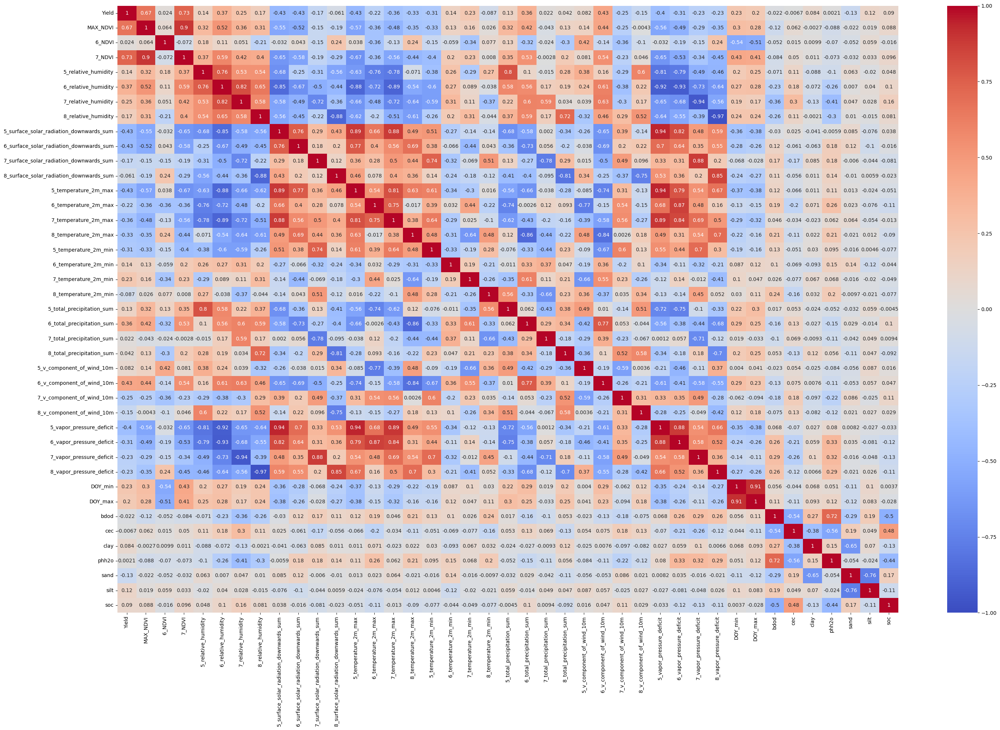

<Figure size 640x480 with 0 Axes>

In [54]:
correlation_matrix = ml_data.drop(columns=['Подразделение', 'Поле','Field_ID', 'Year', 'Агрофон', 'Культура', 'date', 'Area'])

# Calculate the correlation matrix
corr_matrix = correlation_matrix.corr(method='spearman')

# Create a figure and axis
plt.figure(figsize=(30, 20))

# Plot the heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

# Rotate x-axis labels
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# Adjust layout to fit all labels
plt.tight_layout()

# Show the plot
plt.show()
plt.savefig('Correlation_Matrix.png')



Through this heatmap we can see that Maximum NDVI during the Growing Season and July Median NDVI has a very strong correlation with Wheat Yields.